## Accessing HLS2 data with the Planetary Computer STAC API

The HLS2-S30 and HLS2-L30 collections are derived by 'harmonizing' data from the Sentinel-2 constellation and Landsat 8/9 instruments, respectively.  This notebook demonstrates accessing and visualizing data from the derived and originating collections.  It computes and visualizes the NDVI (Normalized Difference Vegetation Index) indicating vegetation health and abundance over time and space, and compares this index by collection.

### Environment Setup

This notebook works with or without an API key, but you will be given more permissive access to the data with an API key.

In [1]:
import pystac_client
import planetary_computer

# Set the environment variable PC_SDK_SUBSCRIPTION_KEY, or set it here.
# pc.settings.set_subscription_key(<YOUR API Key>)

### Data Access

The datasets hosted by Planetary Computer are available in [Azure Blob Storage](https://learn.microsoft.com/en-us/azure/storage/blobs/).  We'll use [pystac-client](https://pystac-client.readthedocs.io/en/stable/) to search the Planetary Computer's [STAC API](https://planetarycomputer.microsoft.com/api/stac/v1/docs) for the subset of data we are interested in, and then we'll load the data directly from Azure Blob Storage.  We'll specify a `modifier` so that we can access the data stored in the Planetary Computer's private Blob Storage Containers.  See [Reading from the STAC API](https://planetarycomputer.microsoft.com/docs/quickstarts/reading-stac/) and [Using tokens for data access for more](https://planetarycomputer.microsoft.com/docs/concepts/sas/).

In [2]:
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
)

### Choose a region and time of interest

This area of interest will return items from Orange County, California.  Later, we can zoom into an even smaller area to calculate the mean Normalized Difference Vegetative Index (NDVI) using `ndvi_bbox_of_interest` or enable a timelapse visualization using `timelapse_bbox_of_interest`, which are formatted for `odc.stac.stac_load`

In [3]:
area_of_interest_polygon = {
    "type": "Polygon",
    "coordinates": [
        [
            [-117.8, 33.65],
            [-117.65, 33.65],
            [-117.65, 33.8],
            [-117.8, 33.8],
            [-117.8, 33.65],
        ]
    ],
}

ndvi_bbox_of_interest = [-117.72, 33.74, -117.7, 33.76]
timelapse_bbox_of_interest = [-117.7549, 33.6536, -117.6911, 33.7622]

Define a time of interest.

In [4]:
time_of_interest = "2022-10-01/2025-04-01"

Search for low-cloud items using `eo:cloud_cover` in each of the collections of interest. 
This query searches for items with <= 10% cloud cover.
Specify the landsat-8 and landsat-9 platforms to avoid degraded data from landsat-7. 

In [5]:
collections = [
    {"collection_id": "landsat-c2-l2", "platforms": ["landsat-8", "landsat-9"]},
    {"collection_id": "hls2-l30", "platforms": ["landsat-8", "landsat-9"]},
    {
        "collection_id": "sentinel-2-l2a",
        "platforms": ["Sentinel-2A", "Sentinel-2B", "Sentinel-2C"],
    },
    {
        "collection_id": "hls2-s30",
        "platforms": ["sentinel-2a", "sentinel-2b", "sentinel-2c"],
    },
]

for collection in collections:
    collection["search"] = catalog.search(
        filter_lang="cql2-json",
        filter={
            "op": "and",
            "args": [
                {
                    "op": "s_contains",
                    "args": [{"property": "geometry"}, area_of_interest_polygon],
                },
                {
                    "op": "anyinteracts",
                    "args": [{"property": "datetime"}, time_of_interest],
                },
                {
                    "op": "=",
                    "args": [{"property": "collection"}, collection["collection_id"]],
                },
                {
                    "op": "in",
                    "args": [{"property": "platform"}, collection["platforms"]],
                },
                {"op": "<=", "args": [{"property": "eo:cloud_cover"}, 10]},
            ],
        },
    )

    collection["items"] = collection["search"].item_collection()
    print(f"{collection['collection_id']} returned {len(collection['items'])} Items")

landsat-c2-l2 returned 103 Items
hls2-l30 returned 62 Items
sentinel-2-l2a returned 91 Items
hls2-s30 returned 57 Items


### Observe available assets with common names from each collection

We can construct a table summarizing the available assets for each collection.  The table indicates the four assets relevant for RGB and NDVI (Normalized Difference Vegetation Index) visualizations, with common names of red, green, blue, and nir/nir08.  Importantly, the datasets do **not** have identical mapping of band names to spectral region.

In [ ]:
from rich.table import Table
from rich import print

# Bands we'll use in RGB/NDVI visualization
target_bands = {"red", "green", "blue", "nir"}

# Initialize rich table and band_name_map
t = Table("Collection ID", "Asset Key", "Common Name")
band_name_map = {}

for collection in collections:
    collection_id = collection["collection_id"]
    item = collection.get("items", [])[0]
    band_map = {}

    for key, asset in item.assets.items():
        common_name = None  # Reset per asset
        bands = asset.extra_fields.get("eo:bands", [])

        if isinstance(bands, list) and len(bands) == 1:
            raw_common_name = bands[0].get("common_name")
            if raw_common_name:
                # Normalize 'nir08' to 'nir', keep everything else
                common_name = "nir" if raw_common_name == "nir08" else raw_common_name

        # Only include if a common name is found (regardless of which one)
        if common_name:
            t.add_row(collection_id, key, common_name)

            if common_name in target_bands and common_name not in band_map:
                band_map[common_name] = key

    band_name_map[collection_id] = band_map

# Show the table
print(t)

┏━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━━━┓
┃ Collection ID  ┃ Asset Key ┃ Common Name ┃
┡━━━━━━━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━━━┩
│ landsat-c2-l2  │ red       │ red         │
│ landsat-c2-l2  │ blue      │ blue        │
│ landsat-c2-l2  │ green     │ green       │
│ landsat-c2-l2  │ nir08     │ nir         │
│ landsat-c2-l2  │ lwir11    │ lwir11      │
│ landsat-c2-l2  │ swir16    │ swir16      │
│ landsat-c2-l2  │ swir22    │ swir22      │
│ landsat-c2-l2  │ coastal   │ coastal     │
│ hls2-l30       │ B01       │ coastal     │
│ hls2-l30       │ B02       │ blue        │
│ hls2-l30       │ B03       │ green       │
│ hls2-l30       │ B04       │ red         │
│ hls2-l30       │ B05       │ nir         │
│ hls2-l30       │ B06       │ swir16      │
│ hls2-l30       │ B07       │ swir22      │
│ hls2-l30       │ B09       │ cirrus      │
│ hls2-l30       │ B10       │ lwir11      │
│ hls2-l30       │ B11       │ lwir12      │
│ sentinel-2-l2a │ B01       │ coastal     │
│ sentinel-2-l2a │ B02       │ blue        │
│ sentinel-2-l2a │ B03       │ green       │
│ sentinel-2-l2a │ B04       │ red         │
│ sentinel-2-l2a │ B05       │ rededge     │
│ sentinel-2-l2a │ B06       │ rededge     │
│ sentinel-2-l2a │ B07       │ rededge     │
│ sentinel-2-l2a │ B08       │ nir         │
│ sentinel-2-l2a │ B11       │ swir16      │
│ sentinel-2-l2a │ B12       │ swir22      │
│ sentinel-2-l2a │ B8A       │ rededge     │
│ hls2-s30       │ B01       │ coastal     │
│ hls2-s30       │ B02       │ blue        │
│ hls2-s30       │ B03       │ green       │
│ hls2-s30       │ B04       │ red         │
│ hls2-s30       │ B08       │ nir         │
│ hls2-s30       │ B10       │ cirrus      │
│ hls2-s30       │ B11       │ swir16      │
│ hls2-s30       │ B12       │ swir22      │
└────────────────┴───────────┴─────────────┘

### Compute NDVI over time for each collection

The Normalized Difference Vegetation Index (NDVI) compares the red and near-infrared signals from each scene as an approximation of the abundance and health of vegetation across time and space. With the functions below, we use `odc.stac.stac_load` to load the red and near-infrared band for each item, compute the NDVI using a standard formula, and calculate the mean NDVI over a defined bounding box.

In [7]:
import pandas as pd
from odc.stac import stac_load


def compute_ndvi(data, band_names):
    red = data[band_names["red"]]
    nir = data[band_names["nir"]]
    ndvi = (nir - red) / (nir + red)
    return ndvi.where((nir + red) != 0)


def mean_ndvi_from_item(item, band_names, bbox):
    try:
        data = stac_load(
            [item], bands=[band_names["red"], band_names["nir"]], bbox=bbox
        ).isel(time=0)

        ndvi = compute_ndvi(data, band_names)
        mean_ndvi = float(ndvi.mean().values)
        timestamp = pd.to_datetime(data.time.values)

        return timestamp, mean_ndvi
    except Exception as e:
        print(f"⚠️ Skipping item due to error: {e}")
        return None, None

And iterate across all items to get the mean NDVI within `ndvi_bbox_of_interest` for each time point within each collection

In [ ]:
ndvi_records = []

total_collections = len(collections)
for ci, collection in enumerate(collections, start=1):
    collection_id = collection["collection_id"]
    items = collection["items"]
    band_names = band_name_map[collection_id]

    print(
        f"[{ci}/{total_collections}] "
        f"Processing collection: {collection_id} ({len(items)} items)"
    )

    for ii, item in enumerate(items, start=1):
        timestamp, mean_ndvi = mean_ndvi_from_item(
            item, band_names, ndvi_bbox_of_interest
        )
        ndvi_records.append(
            {
                "collection_id": collection_id,
                "timestamp": timestamp,
                "mean_ndvi": mean_ndvi,
            }
        )

        # Print progress upon calculating every 40th item,
        # and also the last item
        if ii % 40 == 0 or ii == len(items):
            print(f"    ... {ii}/{len(items)} items processed")

ndvi_df = pd.DataFrame(ndvi_records)

[1/4] Processing collection: landsat-c2-l2 (103 items)

... 40/103 items processed

... 80/103 items processed

... 103/103 items processed

[2/4] Processing collection: hls2-l30 (62 items)

... 40/62 items processed

... 62/62 items processed

[3/4] Processing collection: sentinel-2-l2a (91 items)

... 40/91 items processed

... 80/91 items processed

... 91/91 items processed

[4/4] Processing collection: hls2-s30 (57 items)

... 40/57 items processed

... 57/57 items processed

### View mean NDVI over time across collections

Plotting the mean NDVI over time for each collection, we visually compare how vegetation dynamics are differently represented in the datasets. The time series for hls2-s30 and hls2-l30 closely track one another, despite being derived from different original sensors (Sentinel-2 and Landsat, respectively). This alignment suggests the HLS processing succeeded in harmonizing data across platforms, enabling comparable analysis across space and time from the differing original datasets.

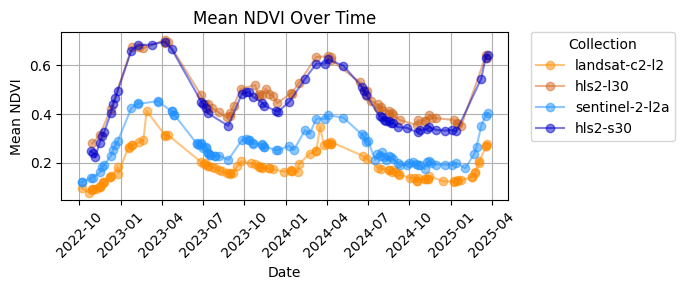

In [9]:
import matplotlib.pyplot as plt

# Define custom colors for collections
collection_colors = {
    "landsat-c2-l2": "darkorange",
    "hls2-l30": "chocolate",
    "sentinel-2-l2a": "dodgerblue",
    "hls2-s30": "mediumblue",
}

plt.figure(figsize=(7, 3))
for collection_id in ndvi_df["collection_id"].unique():
    df = ndvi_df[ndvi_df["collection_id"] == collection_id].sort_values("timestamp")
    plt.plot(
        df["timestamp"].to_numpy(),
        df["mean_ndvi"].to_numpy(),
        marker="o",
        label=collection_id,
        color=collection_colors.get(
            collection_id, None
        ),  # fallback to default if not in map
        alpha=0.5,
    )

plt.title("Mean NDVI Over Time")
plt.ylabel("Mean NDVI")
plt.xlabel("Date")
plt.xticks(rotation=45)
plt.grid(True)
plt.legend(
    title="Collection",
    bbox_to_anchor=(1.05, 1),  # position: right of plot, top aligned
    loc="upper left",
    borderaxespad=0.0,
)
plt.tight_layout()
plt.show()

### Visualize recent RGB and NDVI data from each collection

To explore the data across collections, the following function constructs side-by-side images showing both true-color (RGB) scenes and NDVI maps for recent acquisitions from any item given a `bbox_of_interest`. 

In [ ]:
import pandas as pd
from matplotlib.ticker import ScalarFormatter
import imageio.v2 as imageio
import numpy as np


def visualize_item_rgb_ndvi(collection_id, item, band_names, bbox_of_interest):
    try:
        # Load image data
        data = stac_load(
            [item], bands=list(band_names.values()), bbox=bbox_of_interest
        ).isel(time=0)

        timestamp = pd.to_datetime(data.time.values).strftime("%m/%d/%Y")
        platform = item.properties.get("platform", "unknown")

        # Compute NDVI
        ndvi = compute_ndvi(data, band_names)

        # Create side-by-side plot
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

        # RGB plot
        rgb_keys = ["red", "green", "blue"]
        rgb_bands = [band_names[k] for k in rgb_keys]
        data[rgb_bands].to_array().plot.imshow(robust=True, ax=ax1, add_colorbar=False)
        ax1.set_title(
            f"Natural Color\n{timestamp}, {collection_id}, {platform}", fontsize=10
        )

        # NDVI plot
        ndvi_plot = ndvi.plot.imshow(
            cmap="RdYlGn", ax=ax2, vmin=-1, vmax=1, add_colorbar=False
        )
        ax2.set_title(f"NDVI\n{timestamp}, {collection_id}, {platform}", fontsize=10)

        # Format axes
        for ax in (ax1, ax2):
            ax.xaxis.set_major_formatter(ScalarFormatter(useMathText=True))
            ax.ticklabel_format(style="sci", axis="x", scilimits=(0, 0))

        # Add a shared colorbar for NDVI
        cbar_ax = fig.add_axes(
            [0.92, 0.25, 0.015, 0.5]
        )  # [left, bottom, width, height]
        fig.colorbar(ndvi_plot, cax=cbar_ax)

        # Save to memory buffer
        buf = BytesIO()
        plt.savefig(buf, format="png", dpi=150)
        plt.close(fig)
        buf.seek(0)

        return imageio.imread(buf)

    except Exception as e:
        print(f"⚠️ Skipping item due to error: {e}")
        # Optional fallback to blank image
        return np.zeros((100, 200, 3), dtype=np.uint8)

Iterating over the most first returned item's `timelapse_bbox_of_interest` from each collection, we can compare each dataset visually.

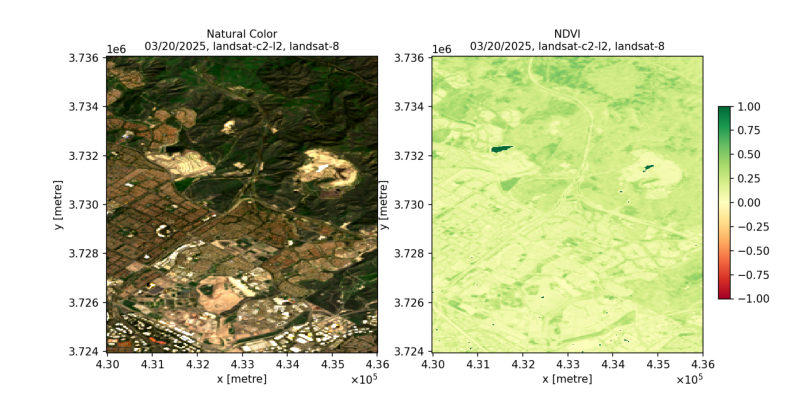

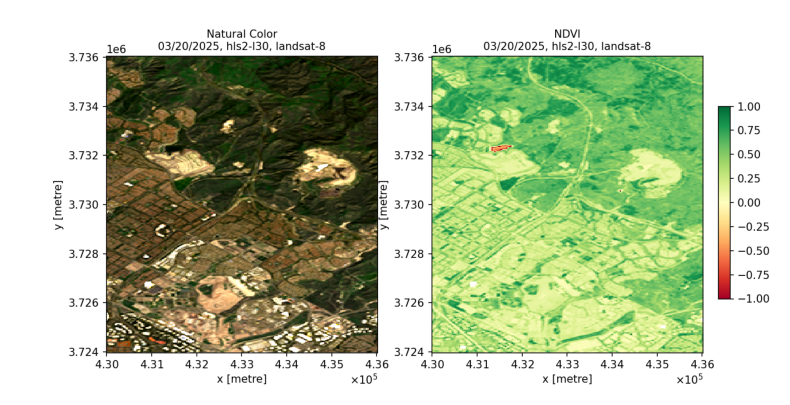

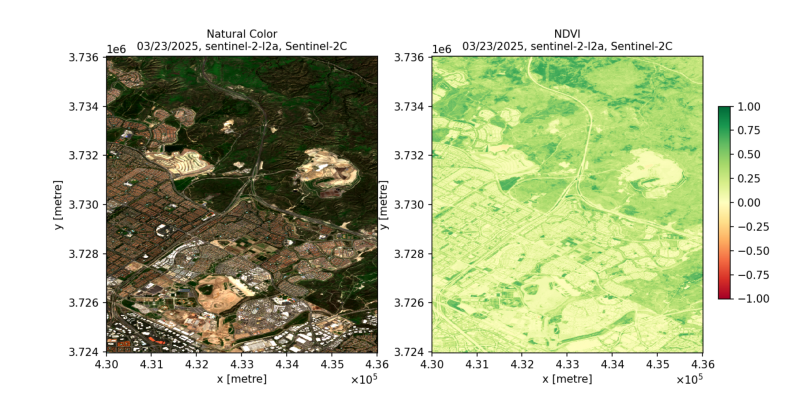

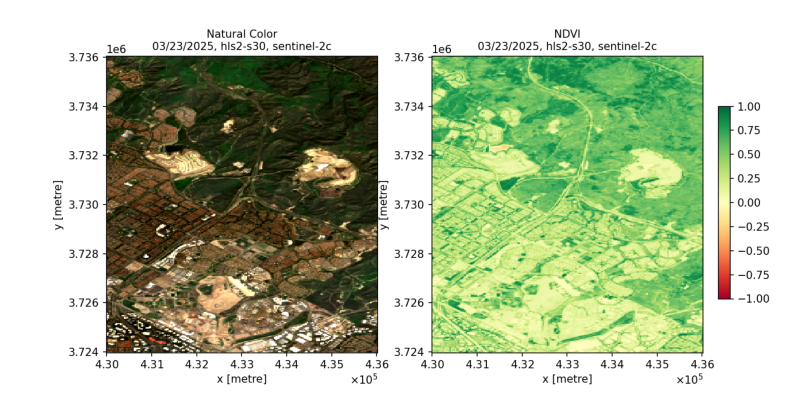

In [11]:
for i in range(0, len(collections)):
    item = collections[i]["items"][0]
    collection_id = collections[i]["collection_id"]
    band_names = band_name_map[collection_id]

    image = visualize_item_rgb_ndvi(
        collection_id, item, band_names, timelapse_bbox_of_interest
    )
    plt.figure(figsize=(10, 5))
    plt.imshow(image)
    plt.axis("off")
    plt.show()

### Watch a timelapse gif from the HLS2, Sentinel collection

We can also construct a gif over all a collection's items `timelapse_bbox_of_interest`.
Notice the seasonal changes in vegetation align with the time series plotted earlier.

Rendering frame 10/57

Rendering frame 20/57

Rendering frame 30/57

Rendering frame 40/57

Rendering frame 50/57

Rendering frame 57/57

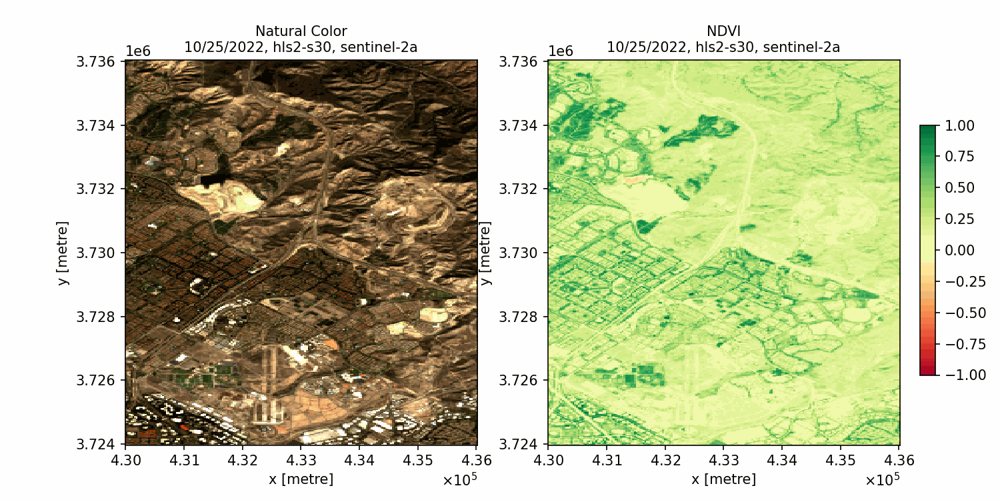

In [12]:
from IPython.display import Image, display
from io import BytesIO

collection_id = "hls2-s30"

# Get sorted items
items = [
    item
    for item in next(c for c in collections if c["collection_id"] == collection_id)[
        "items"
    ]
]
items.sort(key=lambda x: pd.to_datetime(x.properties["datetime"]))

# Generate frames
frames = []
for i, item in enumerate(items):
    if (i + 1) % 10 == 0 or i == len(items) - 1:
        print(f"Rendering frame {i+1}/{len(items)}")
    frame = visualize_item_rgb_ndvi(
        collection_id, item, band_name_map[collection_id], timelapse_bbox_of_interest
    )
    frames.append(frame)

# Create GIF in memory
gif_buffer = BytesIO()
imageio.mimsave(gif_buffer, frames, format="GIF", duration=5, loop=0)
gif_buffer.seek(0)

# Display inline
display(Image(data=gif_buffer.read(), format="png"))